# Twitter analysis


## Reading the dataset with pandas

http://pandas.pydata.org/

In [463]:
import pandas as pd

We read in the input file to get a pandas DataFrame which we use in our analysis. This file can be changed to any file generated by json-csv-converter.py and should be able to generate some graphs representing the structure of the data.

In [464]:
df = pd.read_csv('twitter_data.csv', lineterminator = '\n') # dataframe object

Let's have a quick look at the DataFrame.

In [465]:
df

,id_str,from_user,text,created_at,time,geo_coordinates,user_lang,in_reply_to_user_id_str,in_reply_to_screen_name,from_user_id_str,in_reply_to_status_id_str,source,profile_image_url,user_followers_count,user_friends_count,status_url,entities_str
0,620322235622887424,ImJaqelin,Hablame de ti,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,es,NaN,NaN,1312533678,NaN,"<a href=""http://twitter.com/download/iphone"" r...",http://pbs.twimg.com/profile_images/6148449660...,305.0,187.0,http://twitter.com/ImJaqelin/statuses/62032223...,"{""urls"": [], ""user_mentions"": [], ""symbols"": [..."
1,620322235639705600,porterservice,面倒な手荷物あなたに代わってお運び致します！\n #沖縄 #離島 #石垣島 #石垣空港 #竹...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,ja,NaN,NaN,290306815,NaN,"<a href=""http://porterservice.web.fc2.com/"" re...",http://pbs.twimg.com/profile_images/3146295208...,2146.0,2137.0,http://twitter.com/porterservice/statuses/6203...,"{""urls"": [], ""user_mentions"": [], ""symbols"": [..."
2,620322235635478528,StealingStats,Minecraft Survival Games [MCSG] #011: Texture ...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,en,NaN,NaN,2565008401,NaN,"<a href=""http://www.google.com/"" rel=""nofollow...",http://pbs.twimg.com/profile_images/6192878003...,3147.0,112.0,http://twitter.com/StealingStats/statuses/6203...,"{""urls"": [{""expanded_url"": ""http://youtu.be/o3..."
3,620322235618713600,CharityHolguin,RT @BR_NBA: Stephen and Ayesha Curry welcomed ...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,en,NaN,NaN,551480293,NaN,"<a href=""http://twitter.com/download/iphone"" r...",http://pbs.twimg.com/profile_images/6069610632...,189.0,156.0,http://twitter.com/CharityHolguin/statuses/620...,"{""urls"": [{""expanded_url"": ""http://ble.ac/1Hoi..."
4,620322235635490816,Amir_nag,وقتی توییت ندارید لطفاااا گه توییت نکنید ..,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,fa,NaN,NaN,2450220662,NaN,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",http://pbs.twimg.com/profile_images/5449752369...,280.0,486.0,http://twitter.com/Amir_nag/statuses/620322235...,"{""urls"": [], ""user_mentions"": [], ""symbols"": [..."
5,620322235648077824,star3601,RT @health_ranking: 3位 驚き！本当に-10kg！超人気！これが、本物の...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,ja,NaN,NaN,2479599295,NaN,"<a href=""http://cblt.net/"" rel=""nofollow"">star...",http://abs.twimg.com/sticky/default_profile_im...,667.0,2001.0,http://twitter.com/star3601/statuses/620322235...,"{""urls"": [{""expanded_url"": ""http://bit.ly/1Oov..."
6,620322235635503104,lilkriss3,RT @_kristin_boone_: Yall loving saying Yall s...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,en,NaN,NaN,2773758703,NaN,"<a href=""http://twitter.com/download/iphone"" r...",http://pbs.twimg.com/profile_images/5046638565...,419.0,394.0,http://twitter.com/lilkriss3/statuses/62032223...,"{""urls"": [], ""user_mentions"": [{""screen_name"":..."
7,620322235627257856,McDemi,RT @blowmedemi: GUYS @McDemi IS DOING GAIN TWE...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,en,NaN,NaN,771484392,NaN,"<a href=""http://twitter.com/download/iphone"" r...",http://pbs.twimg.com/profile_images/6152027039...,65249.0,57693.0,http://twitter.com/McDemi/statuses/62032223562...,"{""urls"": [], ""user_mentions"": [{""screen_name"":..."
8,620322235648200704,MauroCoz18,"Voy a tirar el fifa a la mierda, lo odió a ese...",Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,es,NaN,NaN,2757537048,NaN,"<a href=""http://twitter.com/download/android"" ...",http://pbs.twimg.com/profile_images/6116388676...,302.0,280.0,http://twitter.com/MauroCoz18/statuses/6203222...,"{""urls"": [], ""user_mentions"": [], ""symbols"": [..."
9,620322235627106304,Iroha_yenabi,@matna_4014 -&gt; 릭이 깔려 디졌다고합니다,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,ko,2.896796e+09,matna_4014,1077435421,6.203221e+17,"<a href=""https://about.twitter.com/products/tw...",http://pbs.twimg.com/profile_images/6190475195...,129.0,100.0,http://twitter.com

 We can see that a lot of the information we want is either in the text column or the entities_str column. Now we have to refine the dataset to extract some more information before we can do our analysis.

# 1. Refining the dataset

We refine the twitter dataset by using regular expressions and adding more columns to the pandas DataFrame that we can use for analysis.

We want to drop any duplicate rows from our dataset just in case.

In [466]:
df = pd.DataFrame.drop_duplicates(df)

Use regular expressions and json to further refine our dataset. **re_functions.py** contains functions that use regular expressions to match with the dataset and return a more refined result. 

In [467]:
%run re_functions.py

Now let's add new columns to the dataframe by mapping the regular expression functions to get columns with more meaningful and easy to calculate data.

In [468]:
df['source_name'] = df['source'].map(source_name)
df['hashtags'] = df['entities_str'].map(get_hashtags)
df['user_mentions'] = df['entities_str'].map(get_mentions)
df['retweeted_user'] = df['text'].map(get_retweeted)
df['retweeted_user_list'] = df['retweeted_user'].map(to_list)
df['replied_to_user_list'] = df['in_reply_to_screen_name'].map(to_list)

/cs/home/imb3/.local/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/cs/home/imb3/.local/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/cs/home/imb3/.local/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats i

For tweet types, we take 'Tweets' as anything that is not a reply or retweet, otherwise every single row of the dataset would count as a tweet.

In [469]:
df['tweet_type'] = df.apply(lambda row: tweet_type (row), axis = 1)

/cs/home/imb3/.local/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


Now we have lots of new columns in the dataset we can use to analyse it easily! Let's look at our DataFrame again.

In [470]:
df

,id_str,from_user,text,created_at,time,geo_coordinates,user_lang,in_reply_to_user_id_str,in_reply_to_screen_name,from_user_id_str,...,user_friends_count,status_url,entities_str,source_name,hashtags,user_mentions,retweeted_user,retweeted_user_list,replied_to_user_list,tweet_type
0,620322235622887424,ImJaqelin,Hablame de ti,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,es,NaN,NaN,1312533678,...,187.0,http://twitter.com/ImJaqelin/statuses/62032223...,"{""urls"": [], ""user_mentions"": [], ""symbols"": [...",Twitter for iPhone,[],[],NaN,NaN,NaN,tweet
1,620322235639705600,porterservice,面倒な手荷物あなたに代わってお運び致します！\n #沖縄 #離島 #石垣島 #石垣空港 #竹...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,ja,NaN,NaN,290306815,...,2137.0,http://twitter.com/porterservice/statuses/6203...,"{""urls"": [], ""user_mentions"": [], ""symbols"": [...",NaN,"[沖縄, 離島, 石垣島, 石垣空港, 竹富島, 波照間島, 石垣港離島ターミナル, 八重山...",[],NaN,NaN,NaN,tweet
2,620322235635478528,StealingStats,Minecraft Survival Games [MCSG] #011: Texture ...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,en,NaN,NaN,2565008401,...,112.0,http://twitter.com/StealingStats/statuses/6203...,"{""urls"": [{""expanded_url"": ""http://youtu.be/o3...",Google,[],[YouTube],NaN,NaN,NaN,tweet
3,620322235618713600,CharityHolguin,RT @BR_NBA: Stephen and Ayesha Curry welcomed ...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,en,NaN,NaN,551480293,...,156.0,http://twitter.com/CharityHolguin/statuses/620...,"{""urls"": [{""expanded_url"": ""http://ble.ac/1Hoi...",Twitter for iPhone,[],[BR_NBA],BR_NBA,[BR_NBA],NaN,retweet
4,620322235635490816,Amir_nag,وقتی توییت ندارید لطفاااا گه توییت نکنید ..,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,fa,NaN,NaN,2450220662,...,486.0,http://twitter.com/Amir_nag/statuses/620322235...,"{""urls"": [], ""user_mentions"": [], ""symbols"": [...",Twitter Web Client,[],[],NaN,NaN,NaN,tweet
5,620322235648077824,star3601,RT @health_ranking: 3位 驚き！本当に-10kg！超人気！これが、本物の...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,ja,NaN,NaN,2479599295,...,2001.0,http://twitter.com/star3601/statuses/620322235...,"{""urls"": [{""expanded_url"": ""http://bit.ly/1Oov...",star application,[],[health_ranking],health_ranking,[health_ranking],NaN,retweet
6,620322235635503104,lilkriss3,RT @_kristin_boone_: Yall loving saying Yall s...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,en,NaN,NaN,2773758703,...,394.0,http://twitter.com/lilkriss3/statuses/62032223...,"{""urls"": [], ""user_mentions"": [{""screen_name"":...",Twitter for iPhone,[],[_kristin_boone_],_kristin_boone_,[_kristin_boone_],NaN,retweet
7,620322235627257856,McDemi,RT @blowmedemi: GUYS @McDemi IS DOING GAIN TWE...,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,en,NaN,NaN,771484392,...,57693.0,http://twitter.com/McDemi/statuses/62032223562...,"{""urls"": [], ""user_mentions"": [{""screen_name"":...",Twitter for iPhone,[],"[blowmedemi, McDemi]",blowmedemi,[blowmedemi],NaN,retweet
8,620322235648200704,MauroCoz18,"Voy a tirar el fifa a la mierda, lo odió a ese...",Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,es,NaN,NaN,2757537048,...,280.0,http://twitter.com/MauroCoz18/statuses/6203222...,"{""urls"": [], ""user_mentions"": [], ""symbols"": [...",Twitter for Android,[],[],NaN,NaN,NaN,tweet
9,620322235627106304,Iroha_yenabi,@matna_4014 -&gt; 릭이 깔려 디졌다고합니다,Sun Jul 12 20:02:00 +0000 2015,12/07/2015 20:02:00,NaN,ko,2.896796e+09,matna_4014,1077435421,...,100.0,http://twitter.com/Iroha_yenabi/statuses/62032...,"{""urls"": [], ""user_mentions"": [{""screen_name"":...",TweetDeck,[],[matna_4014],NaN,NaN,[matna_4014],reply


We can see to the far right of the table, there are many new columns which we can use for analysis such as hashtags, user_mentions, tweet_type.

## 2. Structure of the dataset
We can now look at the structure of the dataset.

This import allows visualisations to be displayed inline.

In [471]:
get_ipython().magic('matplotlib inline')

In [472]:
df['tweet_type'].value_counts()

tweet      1195
retweet     944
reply       432
Name: tweet_type, dtype: int64

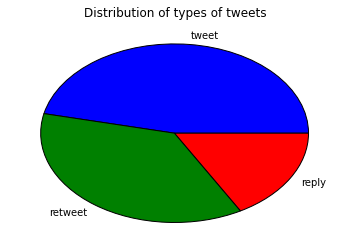

In [473]:
tweet_type_pie = df['tweet_type'].value_counts().plot(kind = 'pie', 
                                                       title = 'Distribution of types of tweets'
                                                      )
tweet_type_pie.set_ylabel('')

# 3. Means and standard deviations
Using our refined dataset, we can easily calculated the mean and standard deviations for replies, retweets and tweets.

In [474]:
typegroup = df.groupby(['tweet_type', 'from_user'])
refinedtg = typegroup.size().reset_index()
refinedtg.rename(columns = {0:'Number'}, inplace = True)

**Mean and standard deviation for replies**

In [475]:
replies = refinedtg.loc[refinedtg['tweet_type'] == 'reply']
rpmean = replies.mean()['Number']
rpstd = replies.std()['Number']

**Mean and standard deviation for retweets**

In [476]:
retweets = refinedtg.loc[refinedtg['tweet_type'] == 'retweet']
rtmean = retweets.mean()['Number']
rtstd = retweets.std()['Number']

**Mean and standard deviation for tweets**

In [477]:
tweets = refinedtg.loc[refinedtg['tweet_type'] == 'tweet']
tmean = tweets.mean()['Number']
tstd = tweets.std()['Number']

Putting it all together into a dictionary

In [478]:
tweetdict = {'Mean per user':{'Tweets':tmean, 'Retweets':rtmean, 'Replies':rpmean},
             'Standard deviation per user':{'Tweets':tstd, 'Retweets':rtstd, 'Replies':rpstd}}

In [479]:
pd.DataFrame.from_dict(tweetdict)

,Mean per user,Standard deviation per user
Replies,1.009346,0.118169
Retweets,1.009626,0.097689
Tweets,1.010144,0.108358


In [480]:
retweeted = df['retweeted_user'].value_counts()
replied = df['in_reply_to_screen_name'].value_counts()

In [481]:
responsedict = {'Mean':{'Times retweeted'
                        :retweeted.mean(), 
                        'Times replied to'
                        :replied.mean()},
                'Standard deviation':{'Times retweeted'
                                      :retweeted.std(),
                                      'Times replied to'
                                      :replied.std()}}

Here we are only including users who were retweeted/replied to at least once

In [482]:
pd.DataFrame.from_dict(responsedict)

,Mean,Standard deviation
Times replied to,1.018868,0.216621
Times retweeted,1.095128,0.530377


### Hashtag timeline
We use Counter to count the number of hashtags and store the result in a tuple.

In [483]:
from collections import Counter

Get the most common hashtags from the dataset

In [484]:
hts_list = [ht for ht in df.hashtags]
hts = [ht for sublist in hts_list for ht in sublist]
ht_count = Counter()

Get hashtags counter

In [485]:
ht_count.update(hts)

Now we can see the most common hashtags and their counts!

In [486]:
ht_count.most_common(10)

[(u'PeterLanzani', 16),
 (u'braceletsbresiliens', 12),
 (u'KCAM\xc9XICO', 11),
 (u'HP1', 9),
 (u'KCAColombia', 8),
 (u'\u0627\u0644\u0633\u0639\u0648\u062f\u064a\u0629', 7),
 (u'AlkisahT7_SahurJKT48', 6),
 (u'\u76f8\u4e92\u30d5\u30a9\u30ed\u30fc', 5),
 (u'MehfilNaatItikafCity', 5),
 (u'YildizinizKadrodaBizimkiArmada', 4)]

Let's make functions to create a plot of the activity given a hashtag

In [487]:
%run hashtag_plot.py

# 4. Hashtag cloud
We use the [wordcloud](http://amueller.github.io/word_cloud/) library to create a nice visualisation of the most common hashtags. 

In [488]:
%run word_cloud.py

Using this library, we are able to generate a very colourful visualisation of the most popular hashtags used in the dataset.

In [489]:
hashtag_wordcloud = make_wc(ht_count.most_common(100))

In [490]:
import matplotlib.pyplot as plt

Let's make the visualisation cleaner by removing gridlines and print the visualisation to a file.

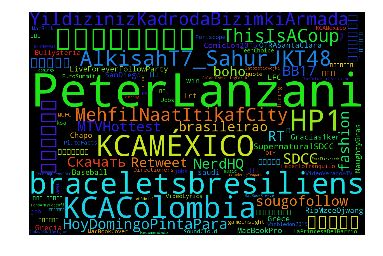

In [491]:
plt.axis('off')
plt.imshow(hashtag_wordcloud)

# 5. Applications used to send tweets

We can see the different sources from our refined column 'source_name'

In [492]:
sources = df['source_name'].value_counts()

Now we can see all the different sources that users tweeted from thanks to our refined dataset.

In [493]:
sources

Twitter for iPhone                         735
Twitter for Android                        647
Twitter Web Client                         297
IFTTT                                      110
TweetDeck                                   63
Twitter for iPad                            62
Hootsuite                                   56
Facebook                                    38
twitterfeed                                 31
Twitter for Windows Phone                   23
Instagram                                   21
Twittascope                                 14
Twitter for BlackBerry                      13
Google                                      11
Twitter for Google TV                        9
iOS                                          9
SocialOomph                                  6
RoundTeam                                    6
Que Personaje de Harry Potter                6
Botize                                       6
Twitter for Android Tablets                  5
twitcle      

In [494]:
sources.size

148

Using this data, we can plot a graph to more clearly see what percentage of users are using the various different applications. But first we have to group all the sources which are very uncommon (<10% of the most common source) into an 'Other' field.

In [495]:
other_total = sources.select(lambda label: sources[label] < sources.max()/10).sum()
sources = sources.select(lambda label: sources[label] >= sources.max()/10)
sources['Other'] = other_total

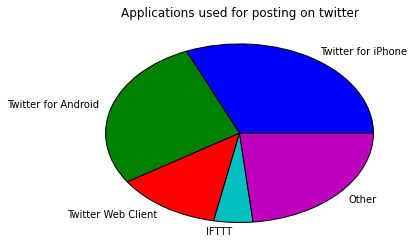

In [496]:
source_plot = sources.plot(kind='pie', title = 'Applications used for posting on twitter')
source_plot.set_ylabel('')

Now let's look at the same data in a bar chart for a more numerical representation.

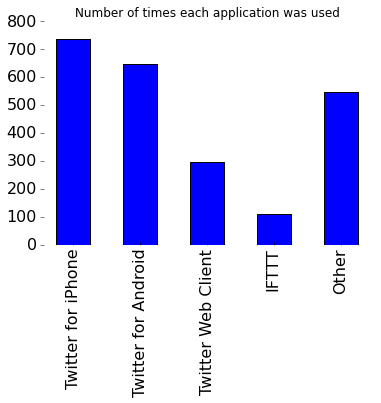

In [497]:
ax = sources.plot(kind='bar', title='Number of times each application was used', fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()

# 6. Networkx and Graphviz
Using the [networkx](https://networkx.github.io/) and [graphviz](http://www.graphviz.org/) libraries, we are able to create graph networks to show the interactions between users, easily seeing which users are mentioned, replied and retweeted the most. The graphs created are quite large and take some time to load because they contain many nodes.

In [498]:
import networkx as nx

We want to create a DiGraph because we want our edges to be directional so we can see who is the user being mentioned and who is the user mentioning someone else.

In [499]:
g = nx.DiGraph()

Because of the number of nodes we have, we want to use graphviz has it as options to set no overlap between our nodes.

In [500]:
A = nx.drawing.nx_agraph.to_agraph(g)

Now let's populate our graph with some nodes! First we will need some data!


In [501]:
datalist = df.retweeted_user.dropna()

In [502]:
xs = [x for x in datalist]
count = Counter(xs)

In [503]:
#creates tuples of (row[t1], row[t2]) and append to tuple_list
def populate_tuple(row, tuple_list, t1, t2):
    tuple_list.append((row[t1], row[t2]))

In [504]:
tuple_list = []
df.dropna(subset=['retweeted_user']).apply(
    lambda row: populate_tuple (row, tuple_list, 'from_user', 'retweeted_user'), axis=1);

With our data in the tuple_list, we can now populate the graph with nodes and edges.

In [505]:
for x in count:
    n = count[x]
    length = len(count)
    A.add_node(x, label=x, fontsize=12+2*n,
              height=1+n/(length/2), width=1+n/(length/3),
              color='firebrick1')

We also need to connect the nodes up with edges using our tuple list from earlier. This will show directed lines which let us see the user interaction for retweets.

In [506]:
A.add_edges_from(tuple_list)

Finally we just have to change a few of the graph settings so there is no overlap between nodes and lines.

In [507]:
A.graph_attr['overlap'] = 'false'
A.graph_attr['splines'] = 'true'
A.node_attr['style'] = 'filled'
A.node_attr['color'] = 'firebrick1'
A.node_attr['fontname'] = 'Helvetica'

 Now we can create an image of visualisation and save it as “retweeted_network.png” 

In [508]:
A.draw('twitter_retweeted_network.png', prog='sfdp')

Let's have a look at the image we created.

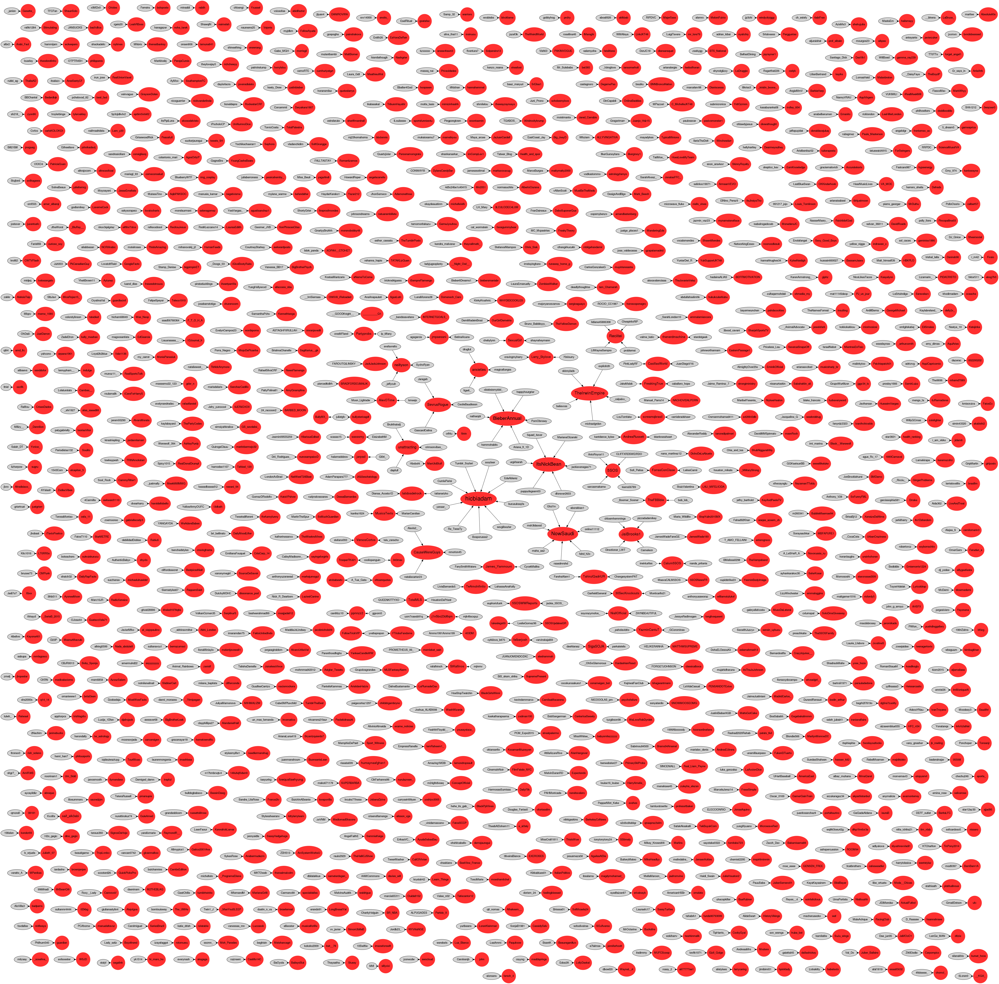

In [509]:
from IPython.display import Image
Image(filename='twitter_retweeted_network.png')

The red nodes represent users in our sample that have been retweeted and grey nodes are users that retweeted others but are not retweeted themselves.

We can do the same for replies instead of retweets.

In [510]:
datalist = df.in_reply_to_screen_name.dropna()
g2 = nx.DiGraph()
A2 = nx.drawing.nx_agraph.to_agraph(g2)

In [511]:
xs = [x for x in datalist]
count = Counter(xs)

In [512]:
#creates tuples of (row[t1], row[t2]) and append to tuple_list
def populate_tuple(row, tuple_list, t1, t2):
    tuple_list.append((row[t1], row[t2]))

In [513]:
tuple_list = []
df.dropna(subset=['in_reply_to_screen_name']).apply(
    lambda row: populate_tuple (row, tuple_list, 'from_user', 'in_reply_to_screen_name'), axis=1);

With our data in the tuple_list, we can now populate the graph with nodes and edges.

In [514]:
for x in count:
    n = count[x]
    length = len(count)
    A2.add_node(x, label=x, fontsize=12+2*n,
              height=1+n/(length/2), width=1+n/(length/3),
              color='firebrick1')

We also need to connect the nodes up with edges using our tuple list from earlier. This will show directed lines which let us see the user interaction for retweets.

In [515]:
A2.add_edges_from(tuple_list)

Finally we just have to change a few of the graph settings so there is no overlap between nodes and lines.

In [516]:
A2.graph_attr['overlap'] = 'false'
A2.graph_attr['splines'] = 'true'
A2.node_attr['style'] = 'filled'
A2.node_attr['color'] = 'firebrick1'
A2.node_attr['fontname'] = 'Helvetica'

Now create the visualisationand save it as “retweeted_network.png” 

In [517]:
A2.draw('twitter_replies_network.png', prog='sfdp')

Let's have a look at the replies network.

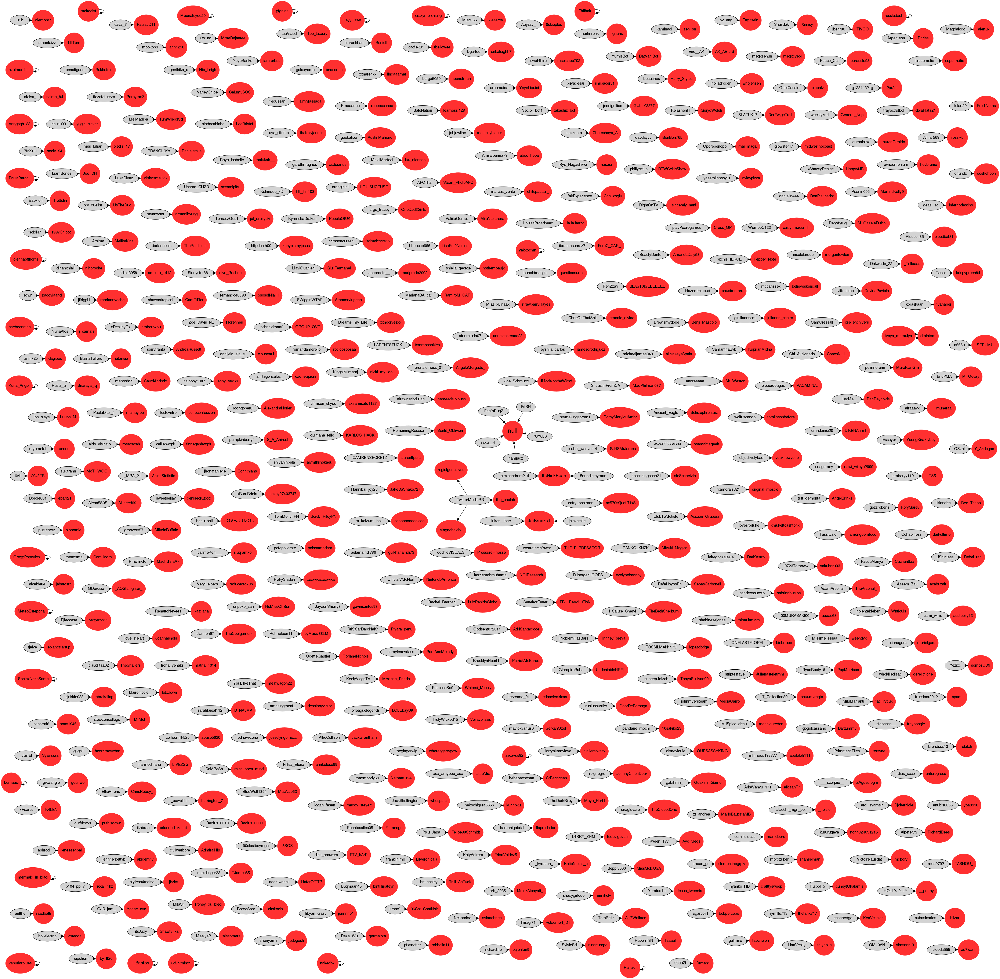

In [518]:
from IPython.display import Image
Image(filename='twitter_replies_network.png')

We can also use networkx to create a different visualisation for the most common hashtags.

In [519]:
ht_bubbles = nx.Graph()
ht_bubbles.add_nodes_from([row[0] for row in ht_count.most_common(20)], count=0)

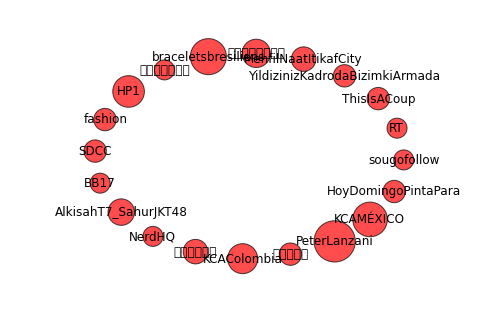

In [520]:
def add_count(g, rows):
    for row in rows:
         g.node[row[0]]['count'] = row[1]
            
add_count(ht_bubbles, ht_count.most_common(20))
cloud_sizes = [100 + 100*ht_bubbles.node[s]['count'] for s in ht_bubbles.nodes()]
nx.draw(ht_bubbles, node_size=cloud_sizes, alpha=0.7, with_labels=True)